<a href="https://colab.research.google.com/github/sanazy/Video-Keyword-Extraction/blob/main/Key_Extraction_from_Persian_Videos.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Introduction

Pipeline of the project is as follows:

![](https://drive.google.com/uc?export=view&id=1wtitXv2pdxmzLFUrl1hkdGY2LxwCIr8z)

* In the first step, audio was extracted from the video file.
* In the second step, to improve the quality of speech some audio manipulation were done. First, music sources were separated from the vocal speech using **spleeter** package. Second, remained stationary noise was reduced using **noisereduce** package.
* In the third step, two pretrained speech recognition models were used. One was **wav2vec** from Facebook and another was **whisper** from OpenAI. These two models are based on the transformer architecture. For **wav2vec**, a pretrained model for Persian was used. In the other hand, **whisper** was able to handle other languages other than English by itself.
As the input, all raw audio, vocal extracted and noise reduced vocal audios were given to these two models. To compare the result, **jellyfish** package were used to compare the manually transciped text and the output texts. 
As it was shown in the figure above, the vocal audio and the raw audio got the best results from the **wav2vec** and **whisper** models, respectively.
* In the next step, the generated texts from the speech-to-text models were given to the spell checker of the **Parsivar** package to improve some misspelling words. Moreover, for the next step of keyword extractoion, some Persian **stop words** were gathered. In this way, keyword extraction methods can ignore stop words as important keywords.   
* In the last step, some methods were used to extract keywords from the generated texts. The simplest method was extracting nouns and adjectives in the sentences using POS tagger of the **Parsivar** package. The second and third methods were using **multi-rake** and **yake** automatic keyword extraction models. The advantages of using these two packages is that they can extract most important keywords of a text regardless of the language. However, we should set proper hyperparameters of these models such as number of n-grams to get desirable keywords. 
At last, to have a visual representation of extracted keywords, a "word cloud** was generated from all of the extracted keywords.

* It is good to mention some methods which were not successfully implemented. Maybe in the future, they can come in handy. First, the famous ["spaCy"](https://spacy.io/) package can easily extract **Named Entity** words which can be considred as the subset of the keywords of a text. Unfortunately, there were no Persian packages to use that.
Second, the ["Perke"](https://github.com/AlirezaTheH/perke) package which is a keyphrase extraction package for Persian could not be implemented because of the version of the installed Python.
Lastly, the ["vosk"](https://alphacephei.com/vosk/)  which is a light-weight speech recognition package could not be used because of the correctness of the generated text.

## Step 0) Environment Preparation

In [ ]:
# connect to colab
from google.colab import drive
drive.mount('/content/drive')
PATH = "/content/drive/MyDrive/ParsPack/"
%cd {PATH}

Mounted at /content/drive
/content/drive/MyDrive/ParsPack


In [ ]:
# install packages
%%capture
!pip install moviepy
!pip3 install imageio==2.4.1
!pip install --upgrade imageio-ffmpeg
!pip install spleeter
!pip install noisereduce
!pip install transformers
!pip install git+https://github.com/openai/whisper.git 
!pip3 install parsivar
!pip install multi-rake
!pip install yake
!pip install jellyfish
!pip install wordcloud-fa

In [ ]:
# import libraries
import moviepy.editor as mp
import librosa
import librosa.display
import matplotlib.pyplot as plt
import IPython.display as ipd
import spleeter
from scipy.io import wavfile
import scipy.io.wavfile
import noisereduce as nr
import torch
from transformers import Wav2Vec2ForCTC, Wav2Vec2Processor
import whisper
import jellyfish
from parsivar import POSTagger, Normalizer, Tokenizer, SpellCheck
from multi_rake import Rake
import yake
from termcolor import colored
from wordcloud_fa import WordCloudFa
%matplotlib inline

Imageio: 'ffmpeg-linux64-v3.3.1' was not found on your computer; downloading it now.
Try 1. Download from https://github.com/imageio/imageio-binaries/raw/master/ffmpeg/ffmpeg-linux64-v3.3.1 (43.8 MB)
Downloading: 8192/45929032 bytes (0.0%)4079616/45929032 bytes (8.9%)7757824/45929032 bytes (16.9%)11968512/45929032 bytes (26.1%)16121856/45929032 bytes (35.1%)20103168/45929032 bytes (43.8%)24109056/45929032 bytes (52.5%)27541504/45929032 bytes (60.0%)31744000/45929032 bytes (69.1%)34914304/45929032 bytes (76.0%)38232064/45929032 bytes (83.2%)41435136/45929032 bytes (90.2%)45481984/45929032 bytes (99.0%)

In [ ]:
# parsivar specllchecker
%%capture
!wget https://www.dropbox.com/s/tlyvnzv1ha9y1kl/spell.zip?dl=0&file_subpath=%2Fonegram.pckl
!unzip spell.zip?dl=0
!rm -rf spell.zip?dl=0
%mkdir /usr/local/lib/python3.7/dist-packages/parsivar/resource/spell
%mv onegram.pckl /usr/local/lib/python3.7/dist-packages/parsivar/resource/spell
%mv mybigram_lm.pckl /usr/local/lib/python3.7/dist-packages/parsivar/resource/spell

In [ ]:
# variables
VIDEO_FILE = "./data/parspack_video.mp4"
AUDIO_RAW = "./data/audio_raw.wav"
SPLEETER_OUTPUT = "./output/audio_raw/vocals.wav"
AUDIO_VOCALS = "./data/audio_vocals.wav"
AUDIO_NOISE_REDUCED = "./data/audio_noise_reduced.wav"
STOP_WORDS_FILE = "./data/stopwords.txt"
WAV2VEV_BEST_OUTPUT = "./data/wav2vec_best.txt"
WHISPER_BEST_OUTPUT = "./data/whisper_best.txt"

## Step 1) Extract Audio from Video [1]

In [ ]:
video_file = mp.VideoFileClip(VIDEO_FILE)
video_file.audio.write_audiofile(AUDIO_RAW)

[MoviePy] Writing audio in ./data/audio_raw.wav


100%|██████████| 1330/1330 [00:02<00:00, 505.90it/s] 

[MoviePy] Done.


## Step 2) Audio Manipulation

### Read raw audio

In [ ]:
raw_data, raw_sr = librosa.load(AUDIO_RAW)
print("Length of the audio array:", raw_data.shape)
print("Sample rate of audio file", raw_sr)

Length of the audio array: (1329615,)
Sample rate of audio file 22050


In [ ]:
# load the WAV audio file
ipd.Audio(data=raw_data, rate=raw_sr) 

### Remove Music from Vocal using Spleeter [2]
Spleeter is the Deezer source separation library with pretrained models written in Python and using Tensorflow.

In [ ]:
!spleeter separate -p spleeter:2stems -o output/ {AUDIO_RAW}
%cp {SPLEETER_OUTPUT} {AUDIO_VOCALS}

INFO:spleeter:File output/audio_raw/vocals.wav written succesfully
INFO:spleeter:File output/audio_raw/vocals.wav written succesfully
INFO:spleeter:File output/audio_raw/accompaniment.wav written succesfully
INFO:spleeter:File output/audio_raw/accompaniment.wav written succesfully


In [ ]:
vocal_data, vocal_sr = librosa.load(AUDIO_VOCALS)

In [ ]:
# load a local WAV file
ipd.Audio(data=vocal_data, rate=vocal_sr) 

### Remove Noise [3]
Noisereduce is a noise reduction algorithm in python that reduces noise in time-domain signals like speech signals.

In [ ]:
vocal_reduced_noise = nr.reduce_noise(y=vocal_data, 
                                      sr=vocal_sr, 
                                      n_std_thresh_stationary=1.5, 
                                      stationary=True)

In [ ]:
ipd.Audio(data=vocal_reduced_noise, rate=vocal_sr)

In [ ]:
# save noise reduced audio file
wavfile.write(AUDIO_NOISE_REDUCED, raw_sr, vocal_reduced_noise)

### Audio Plots

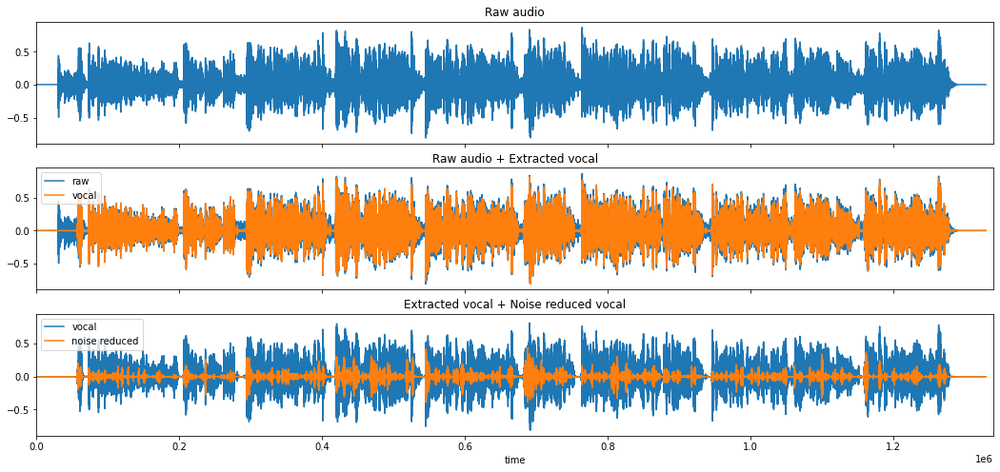

In [ ]:
fig, ax = plt.subplots(nrows=3, sharex=True, sharey=True, figsize=(18,8))
# plots
ax[0].plot(raw_data)
ax[1].plot(raw_data, label="raw")
ax[1].plot(vocal_data, label="vocal")
ax[2].plot(vocal_data, label="vocal")
ax[2].plot(vocal_reduced_noise, label="noise reduced")
# legends
ax[1].legend(loc="upper left")
ax[2].legend(loc="upper left")
# titles
ax[0].set(title="Raw audio")
ax[1].set(title="Raw audio + Extracted vocal")
ax[2].set(title="Extracted vocal + Noise reduced vocal")
# xlabel
ax[2].set(xlabel="time")
# xlimit
ax[2].set_xlim(0, 1.34*1e6)
# show figure
fig.show()

## Step 3) Generate text from audio

### Original Text

In [ ]:
original = """سلام اگه یه روزی به هر دلیلی نیاز داشتید با شماره 125 تماس بگیرید تا آتش نشانا به کمکتون بیان برای برقراری تماس چنتا نکته مهم هست که باید رعایت کنید اولین که خونسردی خودتونو حفظ کنید و آدرس محل حادثه رو به اپراتور 125 دقیق اعلام کنید به علت تشابه اسمی خیلی از کوچه خیابون های شهر بهتر آدرس از یه میدون یا خیابون اصلی شروع کنید اگه آدرس محل حادثه گنگ و پیچیده هست خیلی خوبه که یه نفرو برای راهنمایی آتش نشانا تو مسیر بذارید حتما بعد از تماس تلفن خودتونو در دسترس نگه دارید اپراتور های ستاد فرماندهی ممکنه هر لحظه برای کسب اطلاعات تکمیلی با شما تماس بگیرن و پاسخگو نبودنتون میتونه مشکلاتی رو ایجاد کنه جزئیات مربود به حادثه رو خیلی دقیق به کارشناس مرکز پاسخگویی 125 اعلام کنید چون اونها متناسب با اطلاعات شما نیرو و تجهیزات به محل حادثه اعزام میکنن سعی کنید با مدیریت خودتون مسیر منتهی به محل حادثه رو برای عبور و مرور نیروها باز نگهدارید"""
original

'سلام اگه یه روزی به هر دلیلی نیاز داشتید با شماره 125 تماس بگیرید تا آتش نشانا به کمکتون بیان برای برقراری تماس چنتا نکته مهم هست که باید رعایت کنید اولین که خونسردی خودتونو حفظ کنید و آدرس محل حادثه رو به اپراتور 125 دقیق اعلام کنید به علت تشابه اسمی خیلی از کوچه خیابون های شهر بهتر آدرس از یه میدون یا خیابون اصلی شروع کنید اگه آدرس محل حادثه گنگ و پیچیده هست خیلی خوبه که یه نفرو برای راهنمایی آتش نشانا تو مسیر بذارید حتما بعد از تماس تلفن خودتونو در دسترس نگه دارید اپراتور های ستاد فرماندهی ممکنه هر لحظه برای کسب اطلاعات تکمیلی با شما تماس بگیرن و پاسخگو نبودنتون میتونه مشکلاتی رو ایجاد کنه جزئیات مربود به حادثه رو خیلی دقیق به کارشناس مرکز پاسخگویی 125 اعلام کنید چون اونها متناسب با اطلاعات شما نیرو و تجهیزات به محل حادثه اعزام میکنن سعی کنید با مدیریت خودتون مسیر منتهی به محل حادثه رو برای عبور و مرور نیروها باز نگهدارید'

### Wav2vec model [4-5]
Wav2Vec is one of the current state-of-the-art models for Automatic Speech Recognition due to a self-supervised training.

In [ ]:
# Fine-tuned facebook/wav2vec2-large-xlsr-53 in Persian (Farsi) 
MODEL_NAME = "m3hrdadfi/wav2vec2-large-xlsr-persian"
wav2vec_processor = Wav2Vec2Processor.from_pretrained(MODEL_NAME)
wav2vec_model = Wav2Vec2ForCTC.from_pretrained(MODEL_NAME)

Downloading:   0%|          | 0.00/158 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/138 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.51k [00:00<?, ?B/s]

  "Passing `gradient_checkpointing` to a config initialization is deprecated and will be removed in v5 "



Downloading:   0%|          | 0.00/355 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/85.0 [00:00<?, ?B/s]

Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


Downloading:   0%|          | 0.00/1.26G [00:00<?, ?B/s]

In [ ]:
def wav2vec(filename):
  # The base model pretrained and fine-tuned on 960 hours of Librispeech on 16kHz sampled speech audio.
  # When using the model make sure that your speech input is also sampled at 16Khz.

  # load any audio file of your choice
  speech, rate = librosa.load(filename, sr=16000)
  input_values = wav2vec_processor(speech, return_tensors='pt').input_values

  # Store logits (non-normalized predictions)
  with torch.no_grad():
    logits = wav2vec_model(input_values).logits

  # Store predicted id's
  predicted_ids = torch.argmax(logits, dim=-1)

  # decode the audio to generate text
  # Passing the prediction to the tokenzer decode to get the transcription
  return wav2vec_processor.decode(predicted_ids[0])

In [ ]:
# transcription using wav2vec model on raw audio
wav2vec_raw = wav2vec(AUDIO_RAW)
wav2vec_raw

It is strongly recommended to pass the ``sampling_rate`` argument to this function. Failing to do so can result in silent errors that might be hard to debug.


'سلان اگه یه روزی بههر دلیر نیاز داشتی با شماره صدوبیسپنج تماس بگیدی تا آتشنشلا به مکتون میان برای برقراری تماس چند تا نخته مهن هست که باید رعایت کند اول اینکه ونسلی خودتون حفس کنید اادرس محل حادسه رو به حراتر صد و به سپنج دلیق اعلام کنید علت تشابه اسمی خیلی ت پیچ خیابونای شخر بحتر آدرث رو از ی معگون یا خیابون اصلیشو می کی اگه آدرس محل حادس گنگ و پیشیدس خیلی خوبهکه یک نفر را برای را نمایی آتشتشمهاتون مسیر بزانیدید حتنا بعد از تماس تلفون  خودتون و در دسترس نگهدانید تپراتورهای ستادفرمانده ای ممکنه هر لحظه برای کسب اطلاعات تکمیلی باشما تماس بگیرند و پا ساخونبودنتون میتونه مشکلاتی رو ایجاد ک جزعیات مربوط با حادس رو خیلی دردیت به کاشناس مرکس فس خوی صد وبیس و پن جلمی کنید چون اونا متماس با اطلاعات شما نیرون  تعچیزا به محل حادس اهزا میکند سعی کنید با مدیریت خودتون   مسیر منتری و محل حادسه را برای اون گرو مرور میروها باز نگه دارید'

In [ ]:
# transcription using wav2vec model on seperated vocal audio
wav2vec_vocals = wav2vec(AUDIO_VOCALS)
wav2vec_vocals

It is strongly recommended to pass the ``sampling_rate`` argument to this function. Failing to do so can result in silent errors that might be hard to debug.


'سلام اگه یک روزی به هر دلیلی نیاز داشتید با شمرای صد و بهسپنج تماس بگید وتااتش نشالا به کرکتون بیار برای برقراری تماس چند تا نخت مهم هست که باید رایت خورد ولینکه خنسری خودتون حفس کنید با آدرس محله حادسه رو به پرعاتر صد و بهس  پنج دقیق اعلام کنید بلت تشابه اسمی خیلی ت کوچخیابونهای شهر بهتر آدرس رو از ای میدون یا خیابون اصیلی شروع کنید ای آدرس محل حادث گنگ و پیچیدن خیلی خوبه که یک نفر را برا رآنمایی آتشتشمهاتون مسیر بزارید حتما بعد از تماس تلفون  خودتون و در دسترس نگهدانی کپراتورهای ستاده فرمانده ای ممکنه هر لحظه برای کسب اطلاعات تکمیلی با شما تماس بگیرند و با سخکونبودنتون میتونهد مشکلاتی رو ایجاد کنی جزعیات مربوط بحادسه رو خیلی دردیت به کاشنس مرکز فسوعی صد و بیست و پنجعلان کنید چون اونا متماس با اطلاعات شمانی رو تر چیزات به محلحادث ادا میکند سعی کنید با مدیقیت خودتونهن مسیر منتقی ب محل حادسه رو برای اون برو مرور نیروها باز نگه دارید'

In [ ]:
# transcription using wav2vec model on noise reduced vocal audio
wav2vec_noise_reduced = wav2vec(AUDIO_NOISE_REDUCED)
wav2vec_noise_reduced

It is strongly recommended to pass the ``sampling_rate`` argument to this function. Failing to do so can result in silent errors that might be hard to debug.


'سلام اگر یه ریزی به هر جمینو نیاز واش دا شورای سالی کسپایش تماس بیرینیم تاتشنوشرا به جنتینیار برای برقرابی افتباس چند تا نت پنس که بایاد قعایت اولین که خونسری خود که ن حفس کنید به آدرس محل حادرسه رو به پراتور صد وبیست آیج دلیرنام بلت تشابه اسمی خیلیت موچ خیافلای شهر بهتر آحصو از یه مینون یا خانین اصلی شبودد ایآدرس محل حادث گن  پچیدن خیلی تو که یک نفر رو رایی راهنمایی آتش نشمرز مسیر بزانید حتما بعد از تواس تفان و خودتون و در دسترس نگهدنید حاپراتومهای ستاده فرمندهایم م کنه هر لحظه برای کسب اطلاعات تطویله با شما تماس بگیرد و وعبا سفو نبودنتون میتوند مشکلاتی نو این جان جزیات فربود بهادسه رو خیلی درتیک به کاناشناسه مرکس فسانگوی سر وفست پن جنا کن چون ایران و خناس با اطلاعات شماهی رو تر چیزها به محلعات سرها میکند سعی کنی ب امدیت خودتن وسیر دوطری به محلحادسه رو برای اون فروسن ریمه ها باز نگهدند'

### Whisper model [6]
OpenAI has recently released a new speech recognition model called Whisper which is an automatic speech recognition model trained on 680,000 hours of multilingual data collected from the web.

In [ ]:
whisper_model = whisper.load_model("large")

100%|█████████████████████████████████████| 2.87G/2.87G [00:52<00:00, 58.5MiB/s]


In [ ]:
# transcription using whisper model on raw audio
whisper_raw = whisper_model.transcribe(AUDIO_RAW)["text"]
whisper_raw

' اگه یه روزی به هر دلیلی نیاز داشت با شماره 125 تماس بگیدی تا آتشنشانا به کمکتون بیا برای برغروری تماس چند تا نکته مهم هست که باید رایت کنید اولین که خمسه دی خودتونه هفت کنید و آدرس محل حادثه رو به آپراطور 125 دقیق اعلام کنید به علت تشبه های اسمی خیلی از پیچ خیابون های شهر بیتر آدرس رو از یه میدون یا خیابون اصلی شروع کنید اگه آدرس محل حادثه گرگ و پیچیده هست خیلی خوبه که یه نفر رو برای را نمای آتش نشانایاتو مسیر بذارید حتما بعد از تماس تلفون خودتون رو در دسترس نگه دارید آپراطور های سطاد فرماندهی ممکنه هر لحظه برای کس به اطلاعات تکمیلی با شما تماس بگیرن و پاسخو نبودن اتون میتونه مشکلاتی رو ایجاد کنه جزئیات مربود به حادثه رو خیلی دقیق به کارشناس مرکز پاسخوی 125 الان کنه چون اونها متناسب با اطلاعات شما نیرو و تحچیزات به محل حادثه ازام میکنه به محل حادثه رو برای اوبر و مرور نیروها باز نگه دارید'

In [ ]:
# transcription using whisper model on separated vocal audio
whisper_vocals = whisper_model.transcribe(AUDIO_VOCALS)["text"]
whisper_vocals

' اگه یه روزی به هر دلیل و نیاز داشید با شماره 125 تماص بگید و تا آتشنشانا به کمکتون بیا برای برغروری تماص چندتا نکته مهم هست که باید رایت کنید اولین که خونسگی خودتونه هفت کنید و آدرس محل حادثه رو به آپراطور 125 دقیق اعلام کنید بلت تشبه های اسمی خیلی از کچه خیابون های شهر بیتر آدرس رو از یه میدون یا خیابون اصلی شروع کنید آدرس محل حادثه گنگ و پیچیده هست خیلی خوبه که یه نفر رو برای را نمایی آتش نشانایات و مسیر بذارید حتما بعد از تماص تلفون خودتون رو در دسترس نگه دارید آپراطور های سطحات فرماندهی ممکنه هر لحظه برای کس به اطلاعات تکمیلی با شما تماص بگیرن و پاسوخو نبودن اتون میتونه مشکلاتی رو ایجاد کنید و دوزیات مربود به حادثه رو خیلی درجط به کارشناس مرکز فرس خوی 125 اعلان کنید چون اونها متناسب با اطلاعات شما نیرو و تحچیزات به محل حادثه ازعام میکنند برای او برو مروع نروح ها بازنگه دارید'

In [ ]:
# transcription using whisper model on noise reduced vocal audio
whisper_nr = whisper_model.transcribe(AUDIO_NOISE_REDUCED)["text"]
whisper_nr

' اگه یه دیزی به هر دلیل می نیاز داشت که با شماره 125 تامس بگیدید آتشنشنها به پیانتوی بیار برای بغرگیت تامس چند تو نتیز که باید رایت دارید اولین که خونسانگی خودتو به حفظ کنید به آدرس محل حادثه رو به افرادر 125 دقیقه اعلان بلیلت تشبه هی اسمی خیلی از بیش خیامون های شهر بهتر آدس وضعی میبون یا خیامون اصلی شروعی اگه آدرس محل حادثه گم و پیشیده هست خیلی خوبه که یه نفر رو برای را دماغی آتش نشانهات و مسیر بذارید حتما بعد استماز تلفون خودتونو در دسترست نگه دارید آپراتور های سطحات فرماندهی ممکنه هل لحظه برای کس به اطلاعات تکفیلی با شما تماس بگیرن و پاسفو نبودن تو می تواند مشکلاتی رو ایران جزئی هست مربوط به حادثه رو خیلی دردیف به کاشراز مرکز فسفوی 125 اینابان چون اونها مطرح سب با اطلاعات شما می رو تجیزات به محل حادثه از دردان میکنن سعی کن که مدیت خودتو مصیر مطعیب محل حادثه رو برای اون خونه نیمه ها باز میگهدن'

### Compare transcriptions with original one using jellyfish [7]
jellyfish is a library for approximate & phonetic matching of strings.

In [ ]:
wv_org_raw = jellyfish.jaro_distance(original, wav2vec_raw)
wv_org_voc = jellyfish.jaro_distance(original, wav2vec_vocals)
wv_org_nr = jellyfish.jaro_distance(original, wav2vec_noise_reduced)

print("Similarity between original text and wav2vec output:")
print("-> with raw audio:", round(wv_org_raw,3))
print("-> after vocal seperation:", round(wv_org_voc,3))
print("-> after noise reduction:", round(wv_org_nr,3))

Similarity between original text and wav2vec output:
-> with raw audio: 0.817
-> after vocal seperation: 0.824
-> after noise reduction: 0.808


In [ ]:
# write the best transcription based on the above results into a file
with open(WAV2VEV_BEST_OUTPUT, "w") as text_file:
  text_file.write(wav2vec_vocals)

***

In [ ]:
org_raw = jellyfish.jaro_distance(original, whisper_raw)
org_voc = jellyfish.jaro_distance(original, whisper_vocals)
org_nr = jellyfish.jaro_distance(original, whisper_nr)

print("Similarity between original text and whisper output:")
print("-> with raw audio:", round(org_raw,3))
print("-> after vocal seperation:", round(org_voc,3))
print("-> after noise reduction:", round(org_nr,3))

Similarity between original text and whisper output:
-> with raw audio: 0.839
-> after vocal seperation: 0.814
-> after noise reduction: 0.816


In [ ]:
# write the best transcription based on the above results into a file
with open(WHISPER_BEST_OUTPUT, "w") as text_file:
  text_file.write(whisper_raw)

## Step 4) Extract keywords from generated text

### Load best generated texts 

In [ ]:
with open(WAV2VEV_BEST_OUTPUT) as file:
   wav2vec_best = file.read()

In [ ]:
with open(WHISPER_BEST_OUTPUT) as file:
   whisper_best = file.read() 

### Stop Words [8]

In [ ]:
# load persian stop words file
filename = STOP_WORDS_FILE
with open(filename) as file:
  lines = file.readlines()
  stop_words = [line.rstrip() for line in lines]

### Keyword Highlighter

In [ ]:
# highlight keywords in a given string
def highlight_kwrds(doc, kwrds):
  text = doc
  formattedText = []
  
  for t in text.split():
    if t in kwrds:
      formattedText.append(colored(t,'white','on_green'))
    else: 
      formattedText.append(t)

  print(" ".join(formattedText))

### Parsivar model - Spell Checker [9]
Parsivar is a Python library for Persian text preprocessing.

In [ ]:
myspell_checker = SpellCheck()

In [ ]:
wav2vec_best

'سلام اگه یک روزی به هر دلیلی نیاز داشتید با شمرای صد و بهسپنج تماس بگید وتااتش نشالا به کرکتون بیار برای برقراری تماس چند تا نخت مهم هست که باید رایت خورد ولینکه خنسری خودتون حفس کنید با آدرس محله حادسه رو به پرعاتر صد و بهس  پنج دقیق اعلام کنید بلت تشابه اسمی خیلی ت کوچخیابونهای شهر بهتر آدرس رو از ای میدون یا خیابون اصیلی شروع کنید ای آدرس محل حادث گنگ و پیچیدن خیلی خوبه که یک نفر را برا رآنمایی آتشتشمهاتون مسیر بزارید حتما بعد از تماس تلفون  خودتون و در دسترس نگهدانی کپراتورهای ستاده فرمانده ای ممکنه هر لحظه برای کسب اطلاعات تکمیلی با شما تماس بگیرند و با سخکونبودنتون میتونهد مشکلاتی رو ایجاد کنی جزعیات مربوط بحادسه رو خیلی دردیت به کاشنس مرکز فسوعی صد و بیست و پنجعلان کنید چون اونا متماس با اطلاعات شمانی رو تر چیزات به محلحادث ادا میکند سعی کنید با مدیقیت خودتونهن مسیر منتقی ب محل حادسه رو برای اون برو مرور نیروها باز نگه دارید'

In [ ]:
wav2vec_spch = myspell_checker.spell_corrector(wav2vec_best)
wav2vec_spch = wav2vec_spch.replace("\u200c", "") # remove white space character
wav2vec_spch

'سلام اگر یک روزی به هر دلیلی نیاز داشتند با شورای شد و به سپنج تماس باید وتا اتش ن شالا به کر کتون بیان برای برقراری تماس چند تا نفت مهم است که باید سایت خورد و لینکه خنجری خود تون حفظ کنید با آدرس محله حادثه را به پرعاتر شد و به پنج دقیق اعلام کنید علت تشابه اسمی خیلی ت کوچخیابونهای شهر بهتر آدرس را از ای میدان یا خیابان اصلی شروع کنید ای آدرس محل حادثه جنگ و پیچیده خیلی خوبی که یک نفر را با رونمایی آتشتشمهاتون مسیر بذارید حتما بعد از تماس تلفن خود تون و در دسترس نگهداری اپراتورهای ستاد فرماندهای ممکن هر لحظه برای کسب اطلاعات تکمیلی با شما تماس بگیرند و با سخکونبودنتون میتونید مشکلاتی را ایجاد کند جزییات مربوط ب حادسه رو خیلی در دیت به کاش نس مرکز یسوعی شد و بیست و پنج علان کنید چون او نا تماس با اطلاعات شمالی را در چیز ات به محل حادث ادا میکند سعی کنید با مدیریت خودتون هن مسیر منطقی ب محل حادثه را برای این بر و مرور نیروها از نگه دارند'

***

In [ ]:
whisper_best

' اگه یه روزی به هر دلیلی نیاز داشت با شماره 125 تماس بگیدی تا آتشنشانا به کمکتون بیا برای برغروری تماس چند تا نکته مهم هست که باید رایت کنید اولین که خمسه دی خودتونه هفت کنید و آدرس محل حادثه رو به آپراطور 125 دقیق اعلام کنید به علت تشبه های اسمی خیلی از پیچ خیابون های شهر بیتر آدرس رو از یه میدون یا خیابون اصلی شروع کنید اگه آدرس محل حادثه گرگ و پیچیده هست خیلی خوبه که یه نفر رو برای را نمای آتش نشانایاتو مسیر بذارید حتما بعد از تماس تلفون خودتون رو در دسترس نگه دارید آپراطور های سطاد فرماندهی ممکنه هر لحظه برای کس به اطلاعات تکمیلی با شما تماس بگیرن و پاسخو نبودن اتون میتونه مشکلاتی رو ایجاد کنه جزئیات مربود به حادثه رو خیلی دقیق به کارشناس مرکز پاسخوی 125 الان کنه چون اونها متناسب با اطلاعات شما نیرو و تحچیزات به محل حادثه ازام میکنه به محل حادثه رو برای اوبر و مرور نیروها باز نگه دارید'

In [ ]:
whisper_spch = myspell_checker.spell_corrector(whisper_best)
whisper_spch = whisper_spch.replace("\u200c", "") # remove white space character
whisper_spch

'اگر به روزی به هر دلیلی نیاز داشت با شماره 125 تماس بگیری تا آتشنشانی به کمک تون با برای بر غروری تماس چند تا نکته مهم است که باید رعایت کنید اولین که خمسه در خود تونه هفت کنید و آدرس محل حادثه را به آپراطور 125 دقیق اعلام کنید به علت ت شبههای اسمی خیلی از پیش خیابانهای شهر بهتر آدرس را از به میدان یا خیابان اصلی شروع کنید اگر آدرس محل حادثه مرگ و پیچیده است خیلی خوبی که به نفر را برای را نمای آتش نشانایاتو مسیر بذارید حتما بعد از تماس تلفن خود تون رو در دسترس نگه دارید آپراطورهای ستاد فرماندهی ممکن هر لحظه برای که به اطلاعات تکمیلی با شما تماس بگیرد و پاسخ و نبودن ستون میتونه مشکلاتی را ایجاد کند جزئیات مربوط به حادثه را خیلی دقیق به کارشناس مرکز پاسخ وی 125 الان که چون او نها متناسب با اطلاعات شما نیرو و تحهیزات به محل حادثه از ام میانه به محل حادثه را برای او بر و مرور نیروها از نگه دارند'

### Parsivar model - POS tagger [10]

In [ ]:
def parsivar_kwrds(doc):
  my_tokenizer = Tokenizer()
  my_tagger = POSTagger(tagging_model="stanford")  
  text_tags = my_tagger.parse(my_tokenizer.tokenize_words(doc))
  kws = []
  pos_tag = ['ADJ', 'N'] 

  for token in text_tags:
    if(token[0] in stop_words):
      continue
    if(token[1] in pos_tag):
      kws.append(token[0])
  return kws

In [ ]:
parsivar_wav2vec_kwrds = parsivar_kwrds(wav2vec_spch)
print(parsivar_wav2vec_kwrds)

['سلام', 'روزی', 'دلیلی', 'نیاز', 'شورای', 'سپنج', 'تماس', 'وتا', 'اتش', 'شالا', 'کر', 'کتون', 'بیان', 'برقراری', 'تماس', 'نفت', 'مهم', 'سایت', 'خنجری', 'تون', 'حفظ', 'آدرس', 'محله', 'حادثه', 'پرعاتر', 'دقیق', 'علت', 'تشابه', 'اسمی', 'کوچخیابونهای', 'شهر', 'آدرس', 'میدان', 'خیابان', 'اصلی', 'شروع', 'آدرس', 'محل', 'حادثه', 'جنگ', 'پیچیده', 'خوبی', 'نفر', 'رونمایی', 'آتشتشمهاتون', 'مسیر', 'تماس', 'تلفن', 'تون', 'دسترس', 'نگهداری', 'اپراتورهای', 'ستاد', 'فرماندهای', 'لحظه', 'کسب', 'اطلاعات', 'تکمیلی', 'تماس', 'سخکونبودنتون', 'مشکلاتی', 'ایجاد', 'جزییات', 'مربوط', 'حادسه', 'دیت', 'نس', 'مرکز', 'یسوعی', 'علان', 'تماس', 'اطلاعات', 'شمالی', 'ات', 'محل', 'حادث', 'ادا', 'مدیریت', 'مسیر', 'محل', 'حادثه', 'مرور', 'نیروها', 'نگه']


In [ ]:
highlight_kwrds(wav2vec_spch, parsivar_wav2vec_kwrds)

سلام اگر یک روزی به هر دلیلی نیاز داشتند با شورای شد و به سپنج تماس باید وتا اتش ن شالا به کر کتون بیان برای برقراری تماس چند تا نفت مهم است که باید سایت خورد و لینکه خنجری خود تون حفظ کنید با آدرس محله حادثه را به پرعاتر شد و به پنج دقیق اعلام کنید علت تشابه اسمی خیلی ت کوچخیابونهای شهر بهتر آدرس را از ای میدان یا خیابان اصلی شروع کنید ای آدرس محل حادثه جنگ و پیچیده خیلی خوبی که یک نفر را با رونمایی آتشتشمهاتون مسیر بذارید حتما بعد از تماس تلفن خود تون و در دسترس نگهداری اپراتورهای ستاد فرماندهای ممکن هر لحظه برای کسب اطلاعات تکمیلی با شما تماس بگیرند و با سخکونبودنتون میتونید مشکلاتی را ایجاد کند جزییات مربوط ب حادسه رو خیلی در دیت به کاش نس مرکز یسوعی شد و بیست و پنج علان کنید چون او نا تماس با اطلاعات شمالی را در چیز ات به محل حادث ادا میکند سعی کنید با مدیریت خودتون هن مسیر منطقی ب محل حادثه را برای این بر و مرور نیروها از نگه دارند


***

In [ ]:
parsivar_whisper_kwrds = parsivar_kwrds(whisper_spch)
print(parsivar_whisper_kwrds)

['روزی', 'دلیلی', 'نیاز', 'شماره', '125', 'تماس', 'آتشنشانی', 'کمک', 'تون', 'غروری', 'تماس', 'نکته', 'مهم', 'رعایت', 'خمسه', 'تونه', 'آدرس', 'محل', 'حادثه', 'آپراطور', '125', 'دقیق', 'علت', 'شبههای', 'اسمی', 'خیابانهای', 'شهر', 'آدرس', 'میدان', 'خیابان', 'اصلی', 'شروع', 'آدرس', 'محل', 'حادثه', 'مرگ', 'پیچیده', 'خوبی', 'نفر', 'نمای', 'آتش', 'نشانایاتو', 'مسیر', 'تماس', 'تلفن', 'تون', 'دسترس', 'نگه', 'آپراطورهای', 'ستاد', 'فرماندهی', 'لحظه', 'اطلاعات', 'تکمیلی', 'تماس', 'پاسخ', 'نبودن', 'ستون', 'میتونه', 'مشکلاتی', 'ایجاد', 'جزئیات', 'مربوط', 'حادثه', 'دقیق', 'کارشناس', 'مرکز', 'پاسخ', '125', 'نها', 'متناسب', 'اطلاعات', 'نیرو', 'تحهیزات', 'محل', 'حادثه', 'میانه', 'محل', 'حادثه', 'مرور', 'نیروها', 'نگه']


In [ ]:
highlight_kwrds(whisper_spch, parsivar_whisper_kwrds)

اگر به روزی به هر دلیلی نیاز داشت با شماره 125 تماس بگیری تا آتشنشانی به کمک تون با برای بر غروری تماس چند تا نکته مهم است که باید رعایت کنید اولین که خمسه در خود تونه هفت کنید و آدرس محل حادثه را به آپراطور 125 دقیق اعلام کنید به علت ت شبههای اسمی خیلی از پیش خیابانهای شهر بهتر آدرس را از به میدان یا خیابان اصلی شروع کنید اگر آدرس محل حادثه مرگ و پیچیده است خیلی خوبی که به نفر را برای را نمای آتش نشانایاتو مسیر بذارید حتما بعد از تماس تلفن خود تون رو در دسترس نگه دارید آپراطورهای ستاد فرماندهی ممکن هر لحظه برای که به اطلاعات تکمیلی با شما تماس بگیرد و پاسخ و نبودن ستون میتونه مشکلاتی را ایجاد کند جزئیات مربوط به حادثه را خیلی دقیق به کارشناس مرکز پاسخ وی 125 الان که چون او نها متناسب با اطلاعات شما نیرو و تحهیزات به محل حادثه از ام میانه به محل حادثه را برای او بر و مرور نیروها از نگه دارند


### MultiRake model [11]
Multilingual Rapid Automatic Keyword Extraction (RAKE) is a Automatic keyword extraction from text written in any language.

In [ ]:
rake = Rake(
    min_chars=3,
    max_words=1,
    min_freq=1,
    language_code=None,  # 'en'
    stopwords=set(stop_words),  # {'and', 'of'}
    lang_detect_threshold=50,
    max_words_unknown_lang=2,
    generated_stopwords_percentile=80,
    generated_stopwords_max_len=3,
    generated_stopwords_min_freq=2
)

In [ ]:
rake_wav2vec_tuples = rake.apply(wav2vec_spch)
rake_wav2vec_kwrds = []
for k in rake_wav2vec_tuples:
  rake_wav2vec_kwrds.append(k[0])
print(rake_wav2vec_kwrds)

['سلام', 'روزی', 'شورای', 'شالا', 'پرعاتر', 'دقیق', 'آدرس', 'میدان', 'پیچیده', 'خوبی', 'نفر', 'تون', 'لحظه', 'تماس', 'ایجاد', 'حادسه', 'دیت', 'علان', 'نگه']


In [ ]:
highlight_kwrds(wav2vec_spch, rake_wav2vec_kwrds)

سلام اگر یک روزی به هر دلیلی نیاز داشتند با شورای شد و به سپنج تماس باید وتا اتش ن شالا به کر کتون بیان برای برقراری تماس چند تا نفت مهم است که باید سایت خورد و لینکه خنجری خود تون حفظ کنید با آدرس محله حادثه را به پرعاتر شد و به پنج دقیق اعلام کنید علت تشابه اسمی خیلی ت کوچخیابونهای شهر بهتر آدرس را از ای میدان یا خیابان اصلی شروع کنید ای آدرس محل حادثه جنگ و پیچیده خیلی خوبی که یک نفر را با رونمایی آتشتشمهاتون مسیر بذارید حتما بعد از تماس تلفن خود تون و در دسترس نگهداری اپراتورهای ستاد فرماندهای ممکن هر لحظه برای کسب اطلاعات تکمیلی با شما تماس بگیرند و با سخکونبودنتون میتونید مشکلاتی را ایجاد کند جزییات مربوط ب حادسه رو خیلی در دیت به کاش نس مرکز یسوعی شد و بیست و پنج علان کنید چون او نا تماس با اطلاعات شمالی را در چیز ات به محل حادث ادا میکند سعی کنید با مدیریت خودتون هن مسیر منطقی ب محل حادثه را برای این بر و مرور نیروها از نگه دارند


***

In [ ]:
rake_whisper_tuples = rake.apply(whisper_spch)
rake_whisper_kwrds = []
for k in rake_whisper_tuples:
  rake_whisper_kwrds.append(k[0])
print(rake_whisper_kwrds)

['روزی', 'آتشنشانی', 'رعایت', 'خمسه', 'تونه', 'علت', 'آدرس', 'میدان', 'پیچیده', 'خوبی', 'نفر', 'تون', 'لحظه', 'تماس', 'پاسخ', 'ایجاد', 'حادثه', 'دقیق', 'اطلاعات', 'نیرو', 'تحهیزات', 'میانه', 'نگه', '125']


In [ ]:
highlight_kwrds(whisper_spch, rake_whisper_kwrds)

اگر به روزی به هر دلیلی نیاز داشت با شماره 125 تماس بگیری تا آتشنشانی به کمک تون با برای بر غروری تماس چند تا نکته مهم است که باید رعایت کنید اولین که خمسه در خود تونه هفت کنید و آدرس محل حادثه را به آپراطور 125 دقیق اعلام کنید به علت ت شبههای اسمی خیلی از پیش خیابانهای شهر بهتر آدرس را از به میدان یا خیابان اصلی شروع کنید اگر آدرس محل حادثه مرگ و پیچیده است خیلی خوبی که به نفر را برای را نمای آتش نشانایاتو مسیر بذارید حتما بعد از تماس تلفن خود تون رو در دسترس نگه دارید آپراطورهای ستاد فرماندهی ممکن هر لحظه برای که به اطلاعات تکمیلی با شما تماس بگیرد و پاسخ و نبودن ستون میتونه مشکلاتی را ایجاد کند جزئیات مربوط به حادثه را خیلی دقیق به کارشناس مرکز پاسخ وی 125 الان که چون او نها متناسب با اطلاعات شما نیرو و تحهیزات به محل حادثه از ام میانه به محل حادثه را برای او بر و مرور نیروها از نگه دارند


### YAKE model [12]
Yet Another Keyword Extractor (Yake) library selects the most important keywords using the text statistical features method from the article.

In [ ]:
kw_extractor = yake.KeywordExtractor(lan="fa", 
                                     n=1, # max_ngram_size
                                     dedupLim=0.9, 
                                     top=40, # num of keywords
                                     features=None,
                                     stopwords=set(stop_words))

In [ ]:
yake_wav2vec_tuples = kw_extractor.extract_keywords(wav2vec_spch)
yake_wav2vec_kwrds = []
for k in yake_wav2vec_tuples:
  yake_wav2vec_kwrds.append(k[0])
print(yake_wav2vec_kwrds)

['تماس', 'حادثه', 'محل', 'آدرس', 'تون', 'مسیر', 'اطلاعات', 'سلام', 'روزی', 'دلیلی', 'نیاز', 'شورای', 'سپنج', 'وتا', 'اتش', 'شالا', 'کتون', 'بیان', 'برقراری', 'نفت', 'مهم', 'سایت', 'خورد', 'لینکه', 'خنجری', 'حفظ', 'محله', 'پرعاتر', 'دقیق', 'علت', 'تشابه', 'اسمی', 'کوچخیابونهای', 'شهر', 'میدان', 'خیابان', 'اصلی', 'شروع', 'جنگ', 'پیچیده']


In [ ]:
highlight_kwrds(wav2vec_spch, yake_wav2vec_kwrds)

سلام اگر یک روزی به هر دلیلی نیاز داشتند با شورای شد و به سپنج تماس باید وتا اتش ن شالا به کر کتون بیان برای برقراری تماس چند تا نفت مهم است که باید سایت خورد و لینکه خنجری خود تون حفظ کنید با آدرس محله حادثه را به پرعاتر شد و به پنج دقیق اعلام کنید علت تشابه اسمی خیلی ت کوچخیابونهای شهر بهتر آدرس را از ای میدان یا خیابان اصلی شروع کنید ای آدرس محل حادثه جنگ و پیچیده خیلی خوبی که یک نفر را با رونمایی آتشتشمهاتون مسیر بذارید حتما بعد از تماس تلفن خود تون و در دسترس نگهداری اپراتورهای ستاد فرماندهای ممکن هر لحظه برای کسب اطلاعات تکمیلی با شما تماس بگیرند و با سخکونبودنتون میتونید مشکلاتی را ایجاد کند جزییات مربوط ب حادسه رو خیلی در دیت به کاش نس مرکز یسوعی شد و بیست و پنج علان کنید چون او نا تماس با اطلاعات شمالی را در چیز ات به محل حادث ادا میکند سعی کنید با مدیریت خودتون هن مسیر منطقی ب محل حادثه را برای این بر و مرور نیروها از نگه دارند


***

In [ ]:
yake_whisper_tuples = kw_extractor.extract_keywords(whisper_spch)
yake_whisper_kwrds = []
for k in yake_whisper_tuples:
  yake_whisper_kwrds.append(k[0])
print(yake_whisper_kwrds)

['حادثه', 'محل', 'تماس', 'آدرس', 'تون', 'دقیق', 'نگه', 'اطلاعات', 'پاسخ', 'شماره', 'آپراطور', 'روزی', 'دلیلی', 'نیاز', 'آتشنشانی', 'کمک', 'غروری', 'نکته', 'مهم', 'رعایت', 'خمسه', 'تونه', 'علت', 'شبههای', 'اسمی', 'خیابانهای', 'شهر', 'میدان', 'خیابان', 'اصلی', 'شروع', 'مرگ', 'پیچیده', 'خوبی', 'نفر', 'نمای', 'آتش', 'نشانایاتو', 'مسیر', 'بذارید']


In [ ]:
highlight_kwrds(whisper_spch, yake_whisper_kwrds)

اگر به روزی به هر دلیلی نیاز داشت با شماره 125 تماس بگیری تا آتشنشانی به کمک تون با برای بر غروری تماس چند تا نکته مهم است که باید رعایت کنید اولین که خمسه در خود تونه هفت کنید و آدرس محل حادثه را به آپراطور 125 دقیق اعلام کنید به علت ت شبههای اسمی خیلی از پیش خیابانهای شهر بهتر آدرس را از به میدان یا خیابان اصلی شروع کنید اگر آدرس محل حادثه مرگ و پیچیده است خیلی خوبی که به نفر را برای را نمای آتش نشانایاتو مسیر بذارید حتما بعد از تماس تلفن خود تون رو در دسترس نگه دارید آپراطورهای ستاد فرماندهی ممکن هر لحظه برای که به اطلاعات تکمیلی با شما تماس بگیرد و پاسخ و نبودن ستون میتونه مشکلاتی را ایجاد کند جزئیات مربوط به حادثه را خیلی دقیق به کارشناس مرکز پاسخ وی 125 الان که چون او نها متناسب با اطلاعات شما نیرو و تحهیزات به محل حادثه از ام میانه به محل حادثه را برای او بر و مرور نیروها از نگه دارند


### WordCloud 

In [ ]:
# concatenate all keywords found by three methods
text_cloud = parsivar_wav2vec_kwrds + parsivar_whisper_kwrds + \
             rake_wav2vec_kwrds + rake_whisper_kwrds + \
             yake_wav2vec_kwrds + yake_whisper_kwrds
# join the list of keywords into a string
text_cloud_joined = ' '.join(text_cloud)

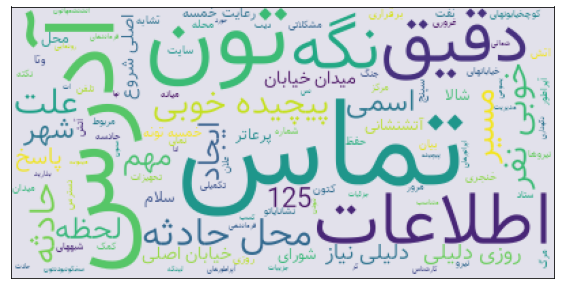

In [ ]:
# generate wordcloud from given text
wordcloud = WordCloudFa(background_color="#e2e1eb")
wc = wordcloud.generate(text_cloud_joined)
image = wc.to_image()
# figure size 
plt.figure(figsize=(10,5))
# disable x and y axes
fig = plt.gca()
fig.axes.get_xaxis().set_visible(False)
fig.axes.get_yaxis().set_visible(False)
# show the result
plt.imshow(image)
plt.show()

## References

[1] https://towardsdatascience.com/extracting-audio-from-video-using-python-58856a940fd

[2] https://towardsdatascience.com/music-source-separation-with-spleeter-on-google-colab-9161dc72d1e8

[3] https://github.com/timsainb/noisereduce

[4] https://towardsdatascience.com/how-to-extract-keywords-from-audio-files-with-natural-language-processing-nlp-3084ceb951c9

[5] https://huggingface.co/m3hrdadfi/wav2vec2-large-xlsr-persian-v3
https://github.com/openai/whisper

[6] https://towardsdatascience.com/speech-to-text-with-openais-whisper-53d5cea9005e

[7] https://github.com/jamesturk/jellyfish

[8] https://github.com/kharazi/persian-stopwords

[9] https://github.com/ICTRC/Parsivar

[10] https://betterprogramming.pub/extract-keywords-using-spacy-in-python-4a8415478fbf

[11] https://github.com/vgrabovets/multi_rake

[12] https://towardsdatascience.com/keyword-extraction-process-in-python-with-natural-language-processing-nlp-d769a9069d5c

[13] https://pypi.org/project/wordcloud-fa/